# <font style="color:blue">Mask / No Mask Detector - YOLO v3 - Windows</font>
In this notebook we will train a custom object detector using YOLO v3,  Specially a face mask detector.

Just for your consideration, we will be creating a folder named YOLO. In the parent directory is located this notebook, but all other files are inside the YOLO folder. 

On the other hand, we will be working with Visual Studio 2019.  So you will have to make this minor change in cmake to work. Remember to fix the architecture if you are not using Visual Studio 2019 (default in other is 32-bits, we will be working on 64-bits).

Pre-requisites for this to work faster is to install CUDA Toolkit and cudnn libraries from the NVIDIA website.

The results of this windows machine where over a NVIDIA GeForce 1660Ti.

**NOTES**:
- *POWERSHELL DOWNLOADING PRETRAINED WEIGHTS TO TEST THE COMPILATION OF DARKNET IS REALLY SLOW, YOU WILL PREFFER TO DO IT MANUALLY*
- *THE OUTPUTS OF THE TRAINING ARE CLEARED, WE SHARED TO YOU THE RESULTS AND THE PRE-TRAINED WEIGHT, SEE THE README.MD*

### <font color="blue">0. Importing and Helper Functions </font>

In this section we will make use of our helper functions that will ease the use over the entire notebook.

Just some imports:
- os : path handling
- cv2: image processing
- IPython: for audio play
- datetime: for getting the timestamp
- random: for shuflying data
- subprocess: for calling functions of the system

In [ ]:
import random
import os
import subprocess
import sys
import cv2
import matplotlib.pyplot as plt
from IPython.display import Audio
from datetime import datetime
%matplotlib inline

This is where a nice soundwave is located on the machine for just tell us when the training ended or when processing YOLO video when it ends to patch the video with the predictions.

Trainings vary from 2 hrs to 30 hrs so is good if you are near to hear that it finished.

In [ ]:
sound_file = 'C:\Windows\Media\Ring10.wav'

The utility function below will help us to display the test image and its predicted labels, also will save the picture on the results folder

In [ ]:
# Utility function to display the output

def display_output(imagePath):
    src = cv2.imread(imagePath,1)
    output = cv2.imread("predictions.jpg")
    
    plt.figure(figsize=[20,8])
    plt.subplot(121)
    plt.imshow(src[:,:,::-1])
    plt.title("Original Image")
    plt.subplot(122)
    plt.imshow(output[:,:,::-1])
    plt.title("Predictions")
    
    file_name = imagePath.split('\\')
    file_name_parts = file_name[2].split('.')
    name_only = file_name_parts[0]
    now = datetime.now() # current date and time
    build = now.strftime("%m-%d-%Y_%H_%M_%S")
    file_save_path = os.path.join(file_name[0], 'result', 'yolov3')
    save_name = os.path.join(file_save_path, name_only + '-yolov3--' + build +'.png')
    plt.savefig(save_name)    
    
    plt.show()    

This class will help us to read a file and modify their lines in a easy way.  An example of usage is in comments below.  On the other hand you will use it on the entire document.

In [ ]:
# Utility class to modify files

# Get a file handler
# mkf = FileMod(doc='.\Makefile')  

# Load the file and view the line numbers
# mkf.load(doc='.\Makefile')

# make a dictionary to modify the file
# mkf_dict = dict({
#                  0:'GPU=1', 
#                  2: 'CUDNN_HALF=1'
#                })
# mkf.mod(doc='.\Makefile', mod_lines=mkf_dict)

# view the print out without line numbers (optional)
# mkf.view()   # view 20 lines
# ... or ...
# mkf.view(10) # view 10 lines

class FileMod():
    def __init__(self, doc=None, *args, **kwargs):
        super(FileMod, self).__init__()
        
        self.mode  = 'r'  # default = read
        self.file  = doc # path of file
        self.dict  = {}   # dict to modify
        self.lines = []   #lines of file

    def load(self, doc=None):
        try:
            if doc==None:
                doc=self.file
            with open(doc, self.mode) as file:
                # read a list of lines into data
                data = file.readlines()
            self.lines = data
            for i, string in enumerate(self.lines):
                print(f"{i}:{string}")
        except Exception as e:
            print(e)

    def mod(self, mod_lines=None):
        # and write everything back
        if mod_lines == None:
            return
        doc = self.file
        self.mode = 'w'
        for lines, data in mod_lines.items():
            string = data + '\n'
            self.lines[lines] = string
            print(f"mod {lines} as {string}")
        with open(doc, 'w') as file:
            file.writelines(self.lines)
        self.mode = 'r'

    def view(self, lines=None):
        if lines == None:
            lines = 20
        doc = self.file
        with open(doc, self.mode) as file:
            # read a list of lines into data
            data = file.readlines()
        for line_num, line in enumerate(data):
            if line_num > lines - 1:
                break
            print(f"{line}\n")

In each step I am doing a dummy *ls* for seein in which folder we are

In [ ]:
%ls

We will then create a folder named *YOLO* and will start working from here

In [ ]:
%mkdir YOLO
%cd YOLO

### <font color="blue">1.  Download Alexey AB YOLO repository to our google drive *yolov3* folder</font>
We now will download the well maintained repository of a YOLO expert, because Joseph Redmon will not continue working on YOLO and because this repo work very well on Windows.

In [ ]:
!git clone https://github.com/AlexeyAB/darknet.git

### <font color="blue">2.  Compile Darknet</font>
Next, some strings on the Makefile needs to be modified before we build darknet from the source.

In [ ]:
%ls

In [ ]:
%cd darknet\build

In [ ]:
mkf = FileMod('..\Makefile')
mkf.load()

In [ ]:
mkfdict = dict({
                0:'GPU=1',
                1:'CUDNN=1',
                3:'OPENCV=1',
                4:'AVX=1'
              })
mkf.mod(mod_lines=mkfdict)

In [ ]:
mkf.view()

In [ ]:
%ls

In [ ]:
print("[INFO] - Building Darknet with cmake")
!cmake -G "Visual Studio 16 2019" ..

In [ ]:
print("[INFO] - Building Darknet Release Mode")
!cmake --build . --target ALL_BUILD
print("[INFO] - End of building darknet!")

In [ ]:
print("[INFO] - Final Steps")
!cmake --build . --target INSTALL
print("[INFO] - You are done for start training or detecting!")

### <font color="blue">3. Move DLLs To The Root Folder of Darknet</font>

Darknet will need phtreadVC2.dll to load correctly so we will be putting it on the root of the darknet folder for simplifying things.

In [ ]:
%cd ..\

In [ ]:
%ls

In [ ]:
!copy 3rdparty\pthreads\bin\* .

### <font color="blue">4. Cloning the Pre-Trained Weights</font>
We will be doing a compilation test with the pre-trained weights of YOLO v3 (just this time).

In [ ]:
%ls

In [ ]:
# We will download the pre-trained weights of yolov3 just this time to test the darknet compilation
# This will take a lot of time, you preferibly will want to do it manually
#download to the https://pjreddie.com/media/files/yolov3.weights
#!powershell -c "(New-Object System.Net.WebClient).DownloadFile('https://pjreddie.com/media/files/yolov3.weights', 'yolov3.weights')"
#Audio(sound_file, autoplay=True)

### <font color="blue">5. Test The Compilation</font>

If everything is OK, in predictions.jpg you will get the image with their bounding boxes and classifications of the classes detected by yolo.

In [ ]:
#!darknet detect cfg\yolov3.cfg yolov3.weights data\dog.jpg -dont_show > NUL

### <font color="blue">6.  Download the *Mask / No Mask Dataset*</font>
Download the curated dataset of face mask and not facemask to our dataset folder, but first lets create a dataset folder.

Usually i like to be very organized.

In [ ]:
%ls

In [ ]:
%cd ../

Next we will download the dataset to this root folder *YOLO*, decompress it on another folder called *dataset* and finally erase the zip file.

In [ ]:
!powershell -c "(New-Object System.Net.WebClient).DownloadFile('https://www.dropbox.com/s/6gewe947ake1g95/kaggle_and_no-mask_dataset.zip?dl=1', '.\kaggle_and_no-mask_dataset.zip')"
!powershell -c "expand-archive -path 'kaggle_and_no-mask_dataset.zip' -destinationpath 'dataset'"
!powershell -c "remove-item -path 'kaggle_and_no-mask_dataset.zip'"

### <font color="blue">7.  Prepare the Train and Test Files</font>
This code provided creates two files, one for the training images and other for the test images.

The dataset is divided in:
- 80% training set 
- 20% test set

In [ ]:
%ls

In [ ]:
image_dir = "dataset"
f_val = open("DS_test.txt", 'w')
f_train = open("DS_train.txt", 'w')

path, dirs, files = next(os.walk(image_dir))
data_size = len(files)

ind = 0
data_test_size = int(0.2 * data_size)
test_array = random.sample(range(data_size), k=data_test_size)

for f in os.listdir(image_dir):
    if(f.split(".")[-1] == "jpg"):
        ind += 1
        
        if ind in test_array:
            f_val.write(image_dir+'/'+f+'\n')
        else:
            f_train.write(image_dir+'/'+f+'\n')

f_train.close()
f_val.close()

### <font color="blue">8.  Prepare and Upload the configuration files</font>

For train and use yolo we need to prepare the neccesary files, finally we will upload to our yolov4 folder.

#### <font color="blue">8.1. Data Setup</font>
In the file **`yolov3-mask_nomask-setup.data`**(uploaded to github and included here), we provided the correct specification of our paths.

Below is the content of this file:
```
classes = 2
train  = DS_train.txt
valid  = DS_test.txt
names = FacialMaskDetector/yolov3/config/yolov3.names
backup = FacialMaskDetector/yolov3/backup/
```

#### <font color="blue">8.2. Training Config File</font>
We also need to provide the  **`yolov3-mask_nomask-train.cfg`**. Based on the default file of darknet folder over the VOC dataset, yolov3-voc.cfg.

#### <font color="blue">8.2.1 Batch hyper-parameter in YOLOv3</font>
We maintain the batch size and the subdivision batch as the default of the file.  That's 20 images to feed in two subgroups.

For the *test configuration file* we will set these params to 1 because we will feed an image.
```
batch=20
subdivisions=10
```
#### <font color="blue">8.2.2 Subdivisions configuration parameter in YOLOv3</font>
For feeding the GPU correcly we slow the training, this action will ensure our machine will be able to train the detector but you could play with this parameter.

In testing mode this will be equal to 1.

### <font color="blue">8.2.3 Width, Height, Channels</font>
A higher resolution the detection will be better but you will sacrifice the time of training.
```
width=352
height=352
channels=3
```
### <font color="blue">8.2.4 Momentum and Decay</font>
These hyperparameters we will maintain as is.
```
momentum=0.949
decay=0.0005
```

### <font color="blue">8.2.5 Learning Rate, Steps, Scales, Burn In (warm-up)</font>
Again, we will be maintaining these hyperparamters as default.  The learning rate will be changed over the 800th iteration.

```
learning_rate=0.0013
policy=steps
steps=6000
scales=.1,.1
burn_in=600
```


### <font color="blue">8.2.6 Data augmentation</font>
For various lighting conditions and different color ranges (over other color spaces).  Sometimes its good to change the angle because a few objects could be rotated.  A facemask in this case we will maintain at 0 degrees but could be augmented to 3° or something low because we are detecting people.
```
angle=0
saturation = 1.5
exposure = 1.5
hue=.1
```

#### <font color="blue">8.2.7 Number of iterations</font>
Process 2000*n_classes iterations run as recommended.  But we will keep in a higher number to see the performance.
```
max_batches=6000
```

#### <font color="blue">8.2.8 Change filters parameter in conv layers [Important for multiple objects]</font>
Fini in the file the conv. layer before the yolo layer with the equation:

**`filters=( classes + 5 ) * 3`**

Our yolo classes are 2, so filters = 21.

### <font color="blue">8.3. yolov3.names file </font>
Specify the classes as...
- Mask (Class 0), 
- No-Mask (Class 1) 

... class labels.

### <font color="blue">8.4. Improving The Network </font>
We observed that on the AlexeyAB repo recommended change some hyperparameters for improving the training accuracy.  These parameters modified are:
- stride=4, near line 890
- layers=23, near line 894
- added max=200 or above at the end of the file

### <font color="blue">9. Cloning the configuration Repository</font>
This repository is prepared with the desired configuration for yolov3 and yolov4.

In this case we will be using yolo v4.  The structure of the folder is as follows:

```
/FacialMaskDetector
├── results
│   ├── yolov3
│   │       ├── README.md
│   ├── yolov4
│           ├── README.md
├── test
│   ├── test-image1.jpg
│   ├── test-image2.jpg
│   ├── test-image3.jpg
│   ├── test-image4.jpg
│   ├── test-video1.jpg
│   ├── test-video2.jpg
├── yolov3
│       ├── backup
│       │   ├── README.md
│       ├── config
│       │   ├── yolov3-mask_nomask-setup.data
│       │   ├── yolov3-mask_nomask-test.cfg
│       │   ├── yolov3-mask_nomask-train.cfg
│       │   ├── yolov3.names
│       ├── weights
│           ├── README.md
├── yolov4
│       ├── backup
│       │   ├── README.md
│       ├── config
│       │   ├── yolov4-mask_nomask-setup.data
│       │   ├── yolov4-mask_nomask-test.cfg
│       │   ├── yolov4-mask_nomask-train.cfg
│       │   ├── yolov4.names
│       ├── weights
│           ├── README.md
├── README.md
```

This will ease for us the way of training and inference.

In [ ]:
%ls

In [ ]:
!git clone https://github.com/issaiass/FacialMaskDetector.git

We need to download the initial weights

In [ ]:
%cd FacialMaskDetector\yolov3\weights

In [ ]:
# Original File : https://pjreddie.com/media/files/darknet53.conv.74
!powershell -c "(New-Object System.Net.WebClient).DownloadFile('"https://www.dropbox.com/s/18dwbfth7prbf0h/darknet53.conv.74?dl=1"', 'darknet53.conv.74')"
Audio(sound_file, autoplay=True)

In [ ]:
%cd ..\..\..\

### <font color="blue">10. Review Hyperparameters</font>

Here we will set the hyperparamters for training the YOLO v4 model.
Below python variables to be the shortcut for fast insertion on the code.

In [603]:
yolo_setup     = 'FacialMaskDetector\\yolov3\\config\\yolov3-mask_nomask-setup.data'
yolo_train     = 'FacialMaskDetector\\yolov3\\config\\yolov3-mask_nomask-train.cfg'
yolo_test      = 'FacialMaskDetector\\yolov3\\config\\yolov3-mask_nomask-test.cfg' 
yolo_weights      = 'FacialMaskDetector\\yolov3\\weights\\darknet53.conv.74'
yolo_best_weights = 'FacialMaskDetector\\yolov3\\backup\\yolov3-mask_nomask-train_best.weights'


In [ ]:
%ls

In [ ]:
CfgHandler = FileMod(yolo_train)
CfgHandler.load()

Enable if you want to modify something in the file.  If you didn't know what linew we changed, but its obvious, you could check at: 
- https://www.diffnow.com/
- https://text-compare.com/

In [ ]:
#                                          # DEFAULT
#config = dict({ 7:'batch=20',              # 64
#                8:'subdivisions=10',       # 16
#                9:'width=320',
#               10:'height=320',
#               19:'learning_rate=0.001',
#               20:'burn_in=600',           # 100
#               21:'max_batches=6000',      # 1000
#               23:'steps=4800,5400',       # 800
#               24:'scales=.1,.1',          # .1
#              605:'filters=21',            # 18
#              611:'classes=2',             #  1
#              690:'filters=21',            # 18
#              696:'classes=2',             #  1
#              775:'filters=21',            # 18
#              781:'classes=2'              #  1
#             })
#
#CfgHandler.mod(config)

In [ ]:
CfgHandler.view(22)

### <font color="blue">11. Start Training </font>
We need to pass the training files for the darknet framework to start the process.

Remember!, we need to specify the complete paths of these files that we talked before:
1. setup file, 
1. config file, 
1. convolutional weights file 

There are a few flags like **`dont_show`** which wont display the graphs and **`map`** - for the mAP calculation over the DS_test.txt file (20% of our data).

In [ ]:
%ls

Below the paths to insert as a variable in the command line as arguments, and to not repeat in the entire notebook

We added an audio sound file, if you are near you will hear a ring tone.

This is the same as:

*!darknet\darknet detector train FacialMaskDetector\yolov3\config\yolov3-mask_nomask-setup.data FacialMaskDetector\yolov4\config\yolov3-mask_nomask-train.cfg FacialMaskDetector\yolov3\weights\darknet53.conv.74 -dont_show -map 2 > train_log.txt*

In [633]:
# Train!
!darknet\darknet detector train $yolo_setup $yolo_train $yolo_weights -dont_show -map 2 > train_log.txt
Audio(sound_file, autoplay=True)

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 OpenCV version: 4.3.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: GeForce GTX 1660 Ti 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 128 0.001 BF
   9 conv     64       1 x 1/ 1    104 x 104 x 128 ->


  51 conv    512       3 x 3/ 1     26 x  26 x 256 ->   26 x  26 x 512 1.595 BF
  52 Shortcut Layer: 49,  wt = 0, wn = 0, outputs:  26 x  26 x 512 0.000 BF
  53 conv    256       1 x 1/ 1     26 x  26 x 512 ->   26 x  26 x 256 0.177 BF
  54 conv    512       3 x 3/ 1     26 x  26 x 256 ->   26 x  26 x 512 1.595 BF
  55 Shortcut Layer: 52,  wt = 0, wn = 0, outputs:  26 x  26 x 512 0.000 BF
  56 conv    256       1 x 1/ 1     26 x  26 x 512 ->   26 x  26 x 256 0.177 BF
  57 conv    512       3 x 3/ 1     26 x  26 x 256 ->   26 x  26 x 512 1.595 BF
  58 Shortcut Layer: 55,  wt = 0, wn = 0, outputs:  26 x  26 x 512 0.000 BF
  59 conv    256       1 x 1/ 1     26 x  26 x 512 ->   26 x  26 x 256 0.177 BF
  60 conv    512       3 x 3/ 1     26 x  26 x 256 ->   26 x  26 x 512 1.595 BF
  61 Shortcut Layer: 58,  wt = 0, wn = 0, outputs:  26 x  26 x 512 0.000 BF
  62 conv   1024       3 x 3/ 2     26 x  26 x 512 ->   13 x  13 x1024 1.595 BF
  63 conv    512       1 x 1/ 1     13 x  13 x1024 ->  

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.525350, GIOU: 0.522420), Class: 0.502363, Obj: 0.281395, No Obj: 0.499110, .5R: 1.000000, .75R: 0.000000, count: 1, class_loss = 257.330505, iou_loss = 0.535950, total_loss = 257.866455 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.392392, GIOU: 0.230534), Class: 0.435325, Obj: 0.440747, No Obj: 0.493398, .5R: 0.000000, .75R: 0.000000, count: 2, class_loss = 1005.090271, iou_loss = 2.384949, total_loss = 1007.475220 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.458134, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 13901.402344, iou_loss = 0.000000, total_loss = 13901.402344 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.498719, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 257.542755, iou_los

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.369770, GIOU: 0.342178), Class: 0.543744, Obj: 0.493884, No Obj: 0.441803, .5R: 0.500000, .75R: 0.000000, count: 2, class_loss = 12979.265625, iou_loss = 2.872070, total_loss = 12982.137695 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.466688, GIOU: 0.365426), Class: 0.611851, Obj: 0.363562, No Obj: 0.498195, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 255.688782, iou_loss = 0.877197, total_loss = 256.565979 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.459997, GIOU: 0.411565), Class: 0.718769, Obj: 0.701004, No Obj: 0.492388, .5R: 0.500000, .75R: 0.000000, count: 2, class_loss = 1000.186462, iou_loss = 1.315552, total_loss = 1001.502014 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.296486, GIOU: 0.213422), Class: 0.347193, Obj: 0.607831, No Obj: 0.443505, .5R: 0.090909, .75R: 0.000000, count: 11, class_loss = 13052.931641, iou

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.422806, GIOU: 0.396098), Class: 0.594519, Obj: 0.011838, No Obj: 0.017646, .5R: 0.333333, .75R: 0.000000, count: 3, class_loss = 2.767692, iou_loss = 3.607199, total_loss = 6.374891 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.477609, GIOU: 0.462324), Class: 0.665107, Obj: 0.001664, No Obj: 0.001685, .5R: 0.428571, .75R: 0.000000, count: 7, class_loss = 4.649252, iou_loss = 4.975263, total_loss = 9.624515 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.040792, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 1.063100, iou_loss = 0.000000, total_loss = 1.063100 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.341842, GIOU: 0.224377), Class: 0.466094, Obj: 0.029399, No Obj: 0.017695, .5R: 0.000000, .75R: 0.000000, count: 4, class_loss = 3.942255, iou_loss = 5.247930, total_

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.023585, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.635190, iou_loss = 0.000000, total_loss = 0.635190 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.010485, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.527696, iou_loss = 0.000000, total_loss = 0.527696 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.211014, GIOU: -0.170160), Class: 0.470540, Obj: 0.000929, No Obj: 0.001148, .5R: 0.000000, .75R: 0.000000, count: 2, class_loss = 1.721186, iou_loss = 5.125572, total_loss = 6.846758 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.342734, GIOU: 0.342734), Class: 0.172883, Obj: 0.012928, No Obj: 0.023191, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 1.518148, iou_loss = 0.795373, total

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.293324, GIOU: 0.199354), Class: 0.474486, Obj: 0.014936, No Obj: 0.007773, .5R: 0.000000, .75R: 0.000000, count: 5, class_loss = 4.270448, iou_loss = 8.519334, total_loss = 12.789782 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.345923, GIOU: 0.286495), Class: 0.651486, Obj: 0.000871, No Obj: 0.000871, .5R: 0.200000, .75R: 0.000000, count: 5, class_loss = 3.415109, iou_loss = 6.290635, total_loss = 9.705744 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.306930, GIOU: 0.261086), Class: 0.523668, Obj: 0.008391, No Obj: 0.016778, .5R: 0.000000, .75R: 0.000000, count: 2, class_loss = 1.674951, iou_loss = 3.362011, total_loss = 5.036962 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.234574, GIOU: 0.234574), Class: 0.638321, Obj: 0.004493, No Obj: 0.007781, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.886870, iou_loss = 1.279499, total

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.005915, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.070289, iou_loss = 0.000000, total_loss = 0.070289 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.500610, GIOU: 0.444896), Class: 0.521650, Obj: 0.001141, No Obj: 0.000688, .5R: 0.500000, .75R: 0.000000, count: 8, class_loss = 6.259181, iou_loss = 5.666883, total_loss = 11.926064 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.285576, GIOU: 0.143686), Class: 0.606725, Obj: 0.013342, No Obj: 0.012209, .5R: 0.000000, .75R: 0.000000, count: 2, class_loss = 1.481865, iou_loss = 2.483671, total_loss = 3.965536 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.005930, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.073811, iou_loss = 0.000000, total

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.683906, GIOU: 0.650013), Class: 0.518480, Obj: 0.014942, No Obj: 0.000824, .5R: 1.000000, .75R: 0.000000, count: 1, class_loss = 0.744550, iou_loss = 0.288333, total_loss = 1.032883 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.539049, GIOU: 0.502294), Class: 0.526447, Obj: 0.040480, No Obj: 0.000206, .5R: 0.625000, .75R: 0.062500, count: 16, class_loss = 11.899516, iou_loss = 9.263854, total_loss = 21.163370 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.001037, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.001317, iou_loss = 0.000000, total_loss = 0.001317 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.474943, GIOU: 0.438217), Class: 0.514043, Obj: 0.124143, No Obj: 0.001499, .5R: 0.444444, .75R: 0.000000, count: 9, class_loss = 5.832943, iou_loss = 6.641892, tot

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.555528, GIOU: 0.511698), Class: 0.492784, Obj: 0.005832, No Obj: 0.000870, .5R: 1.000000, .75R: 0.000000, count: 2, class_loss = 1.485099, iou_loss = 0.804842, total_loss = 2.289941 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.599807, GIOU: 0.510662), Class: 0.530787, Obj: 0.004511, No Obj: 0.000739, .5R: 0.666667, .75R: 0.333333, count: 3, class_loss = 2.043032, iou_loss = 2.232096, total_loss = 4.275128 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.257434, GIOU: 0.171839), Class: 0.299871, Obj: 0.001322, No Obj: 0.000134, .5R: 0.000000, .75R: 0.000000, count: 3, class_loss = 3.085008, iou_loss = 4.296199, total_loss = 7.381207 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000845, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000447, iou_loss = 0.000000, total_

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.606343, GIOU: 0.606326), Class: 0.626670, Obj: 0.002933, No Obj: 0.000112, .5R: 1.000000, .75R: 0.000000, count: 1, class_loss = 0.692375, iou_loss = 0.476337, total_loss = 1.168712 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000787, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.001161, iou_loss = 0.000000, total_loss = 0.001161 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.485436, GIOU: 0.435539), Class: 0.451832, Obj: 0.052901, No Obj: 0.001193, .5R: 0.333333, .75R: 0.000000, count: 6, class_loss = 4.590065, iou_loss = 3.969089, total_loss = 8.559155 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.631166, GIOU: 0.613631), Class: 0.669065, Obj: 0.115040, No Obj: 0.000282, .5R: 0.888889, .75R: 0.000000, count: 9, class_loss = 4.867294, iou_loss = 3.136021, total

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000052, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.081116, iou_loss = 0.000000, total_loss = 0.081116 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.412833, GIOU: 0.333756), Class: 0.771450, Obj: 0.210042, No Obj: 0.000787, .5R: 0.000000, .75R: 0.000000, count: 2, class_loss = 0.771541, iou_loss = 1.670766, total_loss = 2.442307 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.398906, GIOU: 0.385171), Class: 0.954076, Obj: 0.301493, No Obj: 0.000707, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.426914, iou_loss = 0.883482, total_loss = 1.310396 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.841539, GIOU: 0.834759), Class: 0.747997, Obj: 0.001536, No Obj: 0.000029, .5R: 1.000000, .75R: 1.000000, count: 1, class_loss = 0.637337, iou_loss = 0.153158, total

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.473826, GIOU: 0.381617), Class: 0.591247, Obj: 0.003132, No Obj: 0.000304, .5R: 0.500000, .75R: 0.000000, count: 2, class_loss = 1.253859, iou_loss = 1.629993, total_loss = 2.883852 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.585372, GIOU: 0.553008), Class: 0.783982, Obj: 0.000495, No Obj: 0.000013, .5R: 0.727273, .75R: 0.136364, count: 22, class_loss = 12.667529, iou_loss = 10.290719, total_loss = 22.958248 

 Tensor Cores are disabled until the first 1800 iterations are reached.
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.409357, GIOU: 0.409358), Class: 0.898387, Obj: 0.009841, No Obj: 0.000325, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.513935, iou_loss = 0.679337, total_loss = 1.193272 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.700511, GIOU: 0.662486), Class: 0.974571, Obj: 0.513445, No Obj: 0.000492, .5R: 1.000000,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)


v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.754853, GIOU: 0.744955), Class: 0.975033, Obj: 0.688432, No Obj: 0.001453, .5R: 1.000000, .75R: 0.500000, count: 2, class_loss = 0.237113, iou_loss = 0.124610, total_loss = 0.361723 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.597454, GIOU: 0.587463), Class: 0.996681, Obj: 0.625625, No Obj: 0.000183, .5R: 1.000000, .75R: 0.000000, count: 2, class_loss = 0.444309, iou_loss = 0.554659, total_loss = 0.998968 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000006, .5R: 0.000000, .

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.800139, GIOU: 0.800139), Class: 0.996660, Obj: 0.983410, No Obj: 0.001449, .5R: 1.000000, .75R: 0.666667, count: 3, class_loss = 0.002126, iou_loss = 0.150066, total_loss = 0.152191 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000025, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.529189, iou_loss = 0.000000, total_loss = 0.529189 

 Tensor Cores are used.
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000020, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000070, iou_loss = 0.000000, total_loss = 0.000070 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000028, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.006038, io

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000018, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000216, iou_loss = 0.000000, total_loss = 0.000216 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000001, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000023, iou_loss = 0.000000, total_loss = 0.000023 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000034, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000002, iou_loss = 0.000000, total_loss = 0.000002 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.798063, GIOU: 0.790388), Class: 0.980579, Obj: 0.915302, No Obj: 0.004797, .5R: 1.000000, .75R: 0.900000, count: 10, class_loss = 0.224021, iou_loss = 0.756644, total

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.680755, GIOU: 0.663037), Class: 0.934740, Obj: 0.308769, No Obj: 0.001640, .5R: 0.750000, .75R: 0.250000, count: 4, class_loss = 1.305059, iou_loss = 0.651180, total_loss = 1.956239 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.685326, GIOU: 0.680698), Class: 0.861209, Obj: 0.157687, No Obj: 0.000331, .5R: 1.000000, .75R: 0.428571, count: 7, class_loss = 3.638515, iou_loss = 1.552692, total_loss = 5.191206 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000306, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000029, iou_loss = 0.000000, total_loss = 0.000029 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.543029, GIOU: 0.528145), Class: 0.994189, Obj: 0.015350, No Obj: 0.000180, .5R: 1.000000, .75R: 0.000000, count: 1, class_loss = 0.485872, iou_loss = 0.486993, total_

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.458489, GIOU: 0.358935), Class: 0.998388, Obj: 0.016692, No Obj: 0.000054, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.581309, iou_loss = 0.766398, total_loss = 1.347707 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.754124, GIOU: 0.735225), Class: 0.989133, Obj: 0.638086, No Obj: 0.002962, .5R: 1.000000, .75R: 0.500000, count: 2, class_loss = 0.234500, iou_loss = 0.185074, total_loss = 0.419575 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000385, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.013367, iou_loss = 0.000000, total_loss = 0.013367 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000046, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.076922, iou_loss = 0.000000, total

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)


v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000013, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000004, iou_loss = 0.000000, total_loss = 0.000004 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.824962, GIOU: 0.820999), Class: 0.999833, Obj: 0.989636, No Obj: 0.002319, .5R: 1.000000, .75R: 1.000000, count: 3, class_loss = 0.000393, iou_loss = 0.197271, total_loss = 0.197664 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.877785, GIOU: 0.876545), Class: 0.998514, Obj: 0.999420, No Obj: 0.000290, .5R: 1.000000, .

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000006, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000000, iou_loss = 0.000000, total_loss = 0.000000 IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000058, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.003343, iou_loss = 0.000000, total_loss = 0.003343 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000005, .5R: 0.000000, .75

v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.556229, GIOU: 0.499330), Class: 0.949839, Obj: 0.009501, No Obj: 0.000021, .5R: 1.000000, .75R: 0.000000, count: 1, class_loss = 0.743419, iou_loss = 0.256587, total_loss = 1.000006 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.895374, GIOU: 0.895321), Class: 0.999827, Obj: 0.999334, No Obj: 0.002772, .5R: 1.000000, .75R: 1.000000, count: 2, class_loss = 0.000008, iou_loss = 0.032805, total_loss = 0.032813 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.761730, GIOU: 0.749637), Class: 0.997935, Obj: 0.727429, No Obj: 0.000798, .5R: 1.000000, .75R: 0.800000, count: 5, class_loss = 0.447239, iou_loss = 0.576129, total_loss = 1.023368 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.719975, GIOU: 0.708441), Class: 0.895168, Obj: 0.415020, No Obj: 0.000180, .5R: 0.916667, .75R: 0.333333, count: 12, class_loss = 4.789494, iou_loss = 2.000194, tota

Our results:
- class_id = 0, name = Mask, ap = 92.92%   	 (TP = 490, FP = 56) 
- class_id = 1, name = No-Mask, ap = 75.62%   	 (TP = 725, FP = 92) 

- for conf_thresh = 0.25, precision = 0.89, recall = 0.75, F1-score = 0.82 
- for conf_thresh = 0.25, TP = 1215, FP = 148, FN = 396, average IoU = 70.59 % 

- IoU threshold = 50 %, used Area-Under-Curve for each unique Recall 
- mean average precision (mAP@0.50) = 0.842709, or 84.27 % 
 

And the training time was about less than 8 hours depending of the max_batches and width x height of the configuration in the yolo training file.

### <font color="blue">12. Make Inferences</font>

First we did a first step that is to copy the data folder of darknet to the root, because inside are the labels to graph the letters and numbers.  If this step is omited you will see a black box and no inference name.

Next we will have a piece of code for displaying and finally are the inferences of images and pre-recorded video.

The pre-recorded video could be downloaded over the root folder, in this case, our YOLO folder (created on Google Drive) 

In [ ]:
%ls

In [ ]:
!mkdir data
!Xcopy /E /I darknet\data\* data

Below we will list the test files

In [604]:
test_files = [os.path.join('FacialMaskDetector\\test', v) for v in os.listdir('FacialMaskDetector\\test')]

#### <font color="blue">12.1 Scenario 1</font>

Testing only with one man and with facemask.

In [634]:
!darknet\darknet detector test $yolo_setup $yolo_test $yolo_best_weights FacialMaskDetector\test\test-image1.jpg -thresh 0.6 2 > NUL

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 OpenCV version: 4.3.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: GeForce GTX 1660 Ti 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    608 x 608 x   3 ->  608 x 608 x  32 0.639 BF
   1 conv     64       3 x 3/ 2    608 x 608 x  32 ->  304 x 304 x  64 3.407 BF
   2 conv     32       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  32 0.379 BF
   3 conv     64       3 x 3/ 1    304 x 304 x  32 ->  304 x 304 x  64 3.407 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 304 x 304 x  64 0.006 BF
   5 conv    128       3 x 3/ 2    304 x 304 x  64 ->  152 x 152 x 128 3.407 BF
   6 conv     64       1 x 1/ 1    152 x 152 x 128 ->  152 x 152 x  64 0.379 BF
   7 conv    128       3 x 3/ 1    152 x 152 x  64 ->  152 x 152 x 128 3.407 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 152 x 152 x 128 0.003 BF
   9 conv     64       1 x 1/ 1    152 x 152 x 128 ->

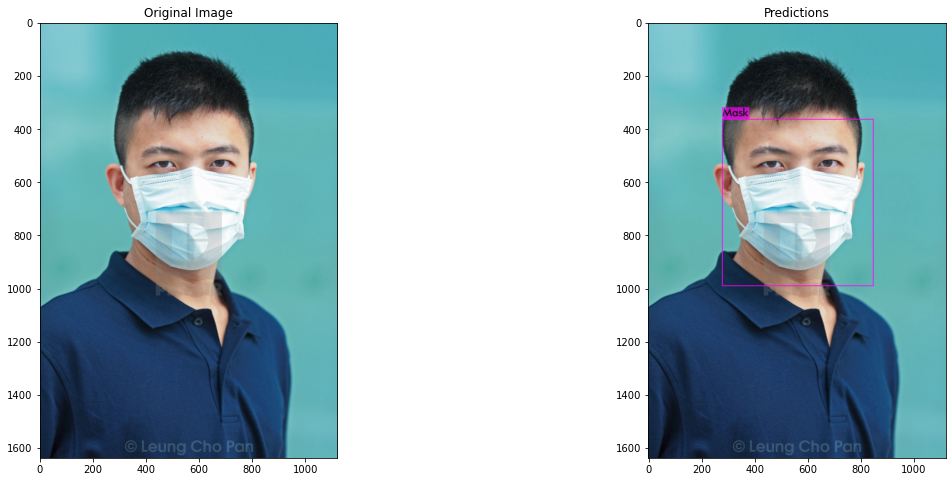

In [635]:
display_output(test_files[0])

#### <font color="blue">12.2 Scenario 2</font>

Testing with different angles of people wearing mask and other not wearing.

In [636]:
!darknet\darknet detector test $yolo_setup $yolo_test $yolo_best_weights FacialMaskDetector\test\test-image2.jpg -thresh 0.6 2 > NUL

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 OpenCV version: 4.3.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: GeForce GTX 1660 Ti 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    608 x 608 x   3 ->  608 x 608 x  32 0.639 BF
   1 conv     64       3 x 3/ 2    608 x 608 x  32 ->  304 x 304 x  64 3.407 BF
   2 conv     32       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  32 0.379 BF
   3 conv     64       3 x 3/ 1    304 x 304 x  32 ->  304 x 304 x  64 3.407 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 304 x 304 x  64 0.006 BF
   5 conv    128       3 x 3/ 2    304 x 304 x  64 ->  152 x 152 x 128 3.407 BF
   6 conv     64       1 x 1/ 1    152 x 152 x 128 ->  152 x 152 x  64 0.379 BF
   7 conv    128       3 x 3/ 1    152 x 152 x  64 ->  152 x 152 x 128 3.407 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 152 x 152 x 128 0.003 BF
   9 conv     64       1 x 1/ 1    152 x 152 x 128 ->

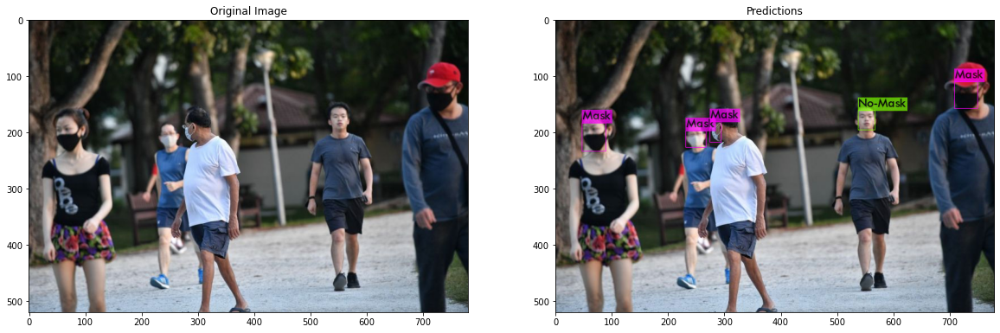

In [637]:
display_output(test_files[1])

#### <font color="blue">12.3 Scenario 3</font>

Testing with a crowd with and without facemask and different scales and variations

In [638]:
!darknet\darknet detector test $yolo_setup $yolo_test $yolo_best_weights FacialMaskDetector\test\test-image3.jpg -thresh 0.6 2 > NUL

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 OpenCV version: 4.3.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: GeForce GTX 1660 Ti 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    608 x 608 x   3 ->  608 x 608 x  32 0.639 BF
   1 conv     64       3 x 3/ 2    608 x 608 x  32 ->  304 x 304 x  64 3.407 BF
   2 conv     32       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  32 0.379 BF
   3 conv     64       3 x 3/ 1    304 x 304 x  32 ->  304 x 304 x  64 3.407 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 304 x 304 x  64 0.006 BF
   5 conv    128       3 x 3/ 2    304 x 304 x  64 ->  152 x 152 x 128 3.407 BF
   6 conv     64       1 x 1/ 1    152 x 152 x 128 ->  152 x 152 x  64 0.379 BF
   7 conv    128       3 x 3/ 1    152 x 152 x  64 ->  152 x 152 x 128 3.407 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 152 x 152 x 128 0.003 BF
   9 conv     64       1 x 1/ 1    152 x 152 x 128 ->

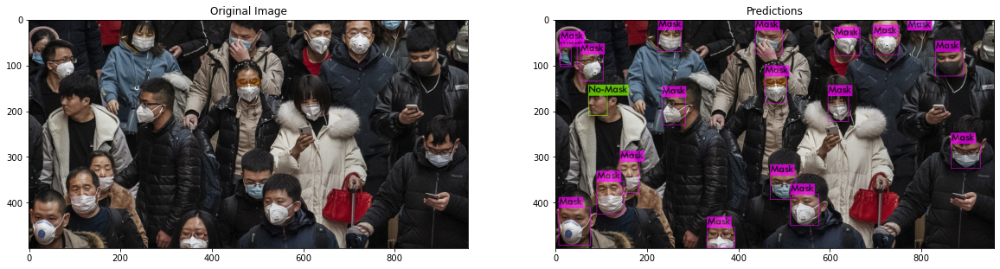

In [639]:
display_output(test_files[2])

#### <font color="blue">12.4 Scenario 4</font>

Testing with several people walking trough the plaza.

In [646]:
!darknet\darknet detector test $yolo_setup $yolo_test $yolo_best_weights FacialMaskDetector\test\test-image4.jpg -thresh .1 2 > NUL

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 OpenCV version: 4.3.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: GeForce GTX 1660 Ti 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    512 x 512 x   3 ->  512 x 512 x  32 0.453 BF
   1 conv     64       3 x 3/ 2    512 x 512 x  32 ->  256 x 256 x  64 2.416 BF
   2 conv     32       1 x 1/ 1    256 x 256 x  64 ->  256 x 256 x  32 0.268 BF
   3 conv     64       3 x 3/ 1    256 x 256 x  32 ->  256 x 256 x  64 2.416 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 256 x 256 x  64 0.004 BF
   5 conv    128       3 x 3/ 2    256 x 256 x  64 ->  128 x 128 x 128 2.416 BF
   6 conv     64       1 x 1/ 1    128 x 128 x 128 ->  128 x 128 x  64 0.268 BF
   7 conv    128       3 x 3/ 1    128 x 128 x  64 ->  128 x 128 x 128 2.416 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 128 x 128 x 128 0.002 BF
   9 conv     64       1 x 1/ 1    128 x 128 x 128 ->

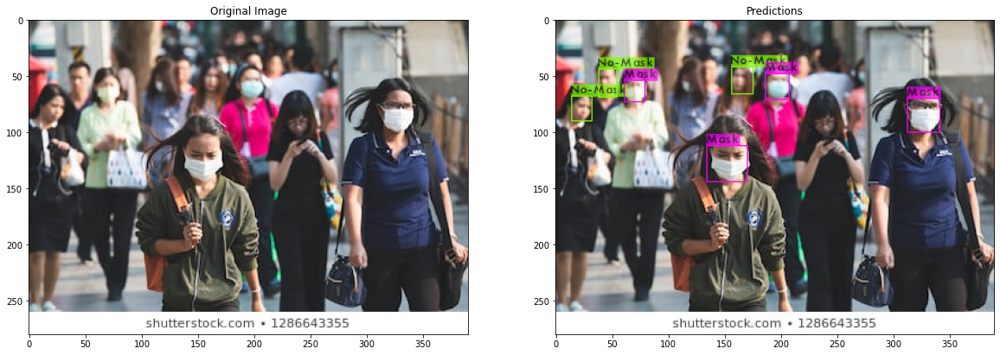

In [641]:
display_output(test_files[3])

#### <font color="blue">10.5 Scenario 5</font>

Testing over a video of people wearing or not wearing mask, good lighting conditions.  Probably will take between 1.5 to 3 min for generate the video.

In [625]:
!darknet\darknet detector demo $yolo_setup $yolo_test $yolo_best_weights FacialMaskDetector\test\test-video1.mp4 -thresh 0.6 2 -out_filename out-vid1.avi -dont_show
Audio(sound_file, autoplay=True)

 _DEBUG is used 
 CUDNN_HALF=1 
Demo
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 

 seen 64, trained: 78 K-images (1 Kilo-batches_64) 
video file: FacialMaskDetector\test\test-video1.mp4
[ INFO:0] global C:\OpenCV\OpenCV-4.3.0\opencv\modules\videoio\src\videoio_registry.cpp (191) cv::`anonymous-namespace'::VideoBackendRegistry::VideoBackendRegistry VIDEOIO: Enabled backends(7, sorted by priority): FFMPEG(1000); GSTREAMER(990); INTEL_MFX(980); MSMF(970); DSHOW(960); CV_IMAGES(950); CV_MJPEG(940)
[ INFO:0] global C:\OpenCV\OpenCV-4.3.0\opencv\modules\videoio\src\backend_plugin.cpp (370) cv::impl::getPluginCandidates Found 3 plugin(s) for FFMPEG
[ INFO:0] global C:\OpenCV\OpenCV-4.3.0\opencv\modules\videoio\src\backend_plugin.cpp (175) cv::impl::DynamicLib::libraryLoad load C:\OpenCV\OpenCV-4.3.0\opencv\build\install\x64\vc16\bin\opencv_videoio_ffmpeg430_64d.dll => FAILED
[ INFO:0] global C:\OpenCV\OpenCV-4.3.0\opencv\modules\videoio\src\backend_plugin.c

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 OpenCV version: 4.3.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: GeForce GTX 1660 Ti 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    608 x 608 x   3 ->  608 x 608 x  32 0.639 BF
   1 conv     64       3 x 3/ 2    608 x 608 x  32 ->  304 x 304 x  64 3.407 BF
   2 conv     32       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  32 0.379 BF
   3 conv     64       3 x 3/ 1    304 x 304 x  32 ->  304 x 304 x  64 3.407 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 304 x 304 x  64 0.006 BF
   5 conv    128       3 x 3/ 2    304 x 304 x  64 ->  152 x 152 x 128 3.407 BF
   6 conv     64       1 x 1/ 1    152 x 152 x 128 ->  152 x 152 x  64 0.379 BF
   7 conv    128       3 x 3/ 1    152 x 152 x  64 ->  152 x 152 x 128 3.407 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 152 x 152 x 128 0.003 BF
   9 conv     64       1 x 1/ 1    152 x 152 x 128 ->

FPS:0.8 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:1.2 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:1.5 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:1.7 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:2.0 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:2.2 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:2.4 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:2.6 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:2.7 


  86 route  85 61 	                           ->   38 x  38 x 768 
  87 conv    256       1 x 1/ 1     38 x  38 x 768 ->   38 x  38 x 256 0.568 BF
  88 conv    512       3 x 3/ 1     38 x  38 x 256 ->   38 x  38 x 512 3.407 BF
  89 conv    256       1 x 1/ 1     38 x  38 x 512 ->   38 x  38 x 256 0.379 BF
  90 conv    512       3 x 3/ 1     38 x  38 x 256 ->   38 x  38 x 512 3.407 BF
  91 conv    256       1 x 1/ 1     38 x  38 x 512 ->   38 x  38 x 256 0.379 BF
  92 conv    512       3 x 3/ 1     38 x  38 x 256 ->   38 x  38 x 512 3.407 BF
  93 conv     21       1 x 1/ 1     38 x  38 x 512 ->   38 x  38 x  21 0.031 BF
  94 yolo
[yolo] params: iou loss: mse (2), iou_norm: 0.75, cls_norm: 1.00, scale_x_y: 1.00
  95 route  91 		                           ->   38 x  38 x 256 
  96 conv    128       1 x 1/ 1     38 x  38 x 256 ->   38 x  38 x 128 0.095 BF
  97 upsample                 4x    38 x  38 x 128 ->  152 x 152 x 128
  98 route  97 11 	                           ->  152 x 152 x 25

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:3.9 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:4.0 	 AVG_FPS:4.3

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:4.0 	 AVG_FPS:4.3

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:4.0 	 AVG_FPS:4.3

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:4.0 	 AVG_FPS:4.3

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 

FPS:4.0 	 AVG_FPS:4.3

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
Mask: 99% 

FPS:4.1 	 AVG_FPS:4.3

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 
Mask: 100% 

FPS:4.1 	 AVG_FPS:4.3

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 100% 
No-Mask: 100% 


#### <font color="blue">10.6 Scenario 6</font>

A video of the crowd.  Variable ligth conditions.  The video will be generated between 5 to 7 minutes.

In [626]:
!darknet\darknet detector demo $yolo_setup $yolo_test $yolo_best_weights FacialMaskDetector\test\test-video2.mp4 -thresh 0.6 2 -out_filename out-vid2.avi -dont_show
Audio(sound_file, autoplay=True)


No-Mask: 100% 
Mask: 73% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 95% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 95% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Object

Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 100% 
Mask: 100% 
Mask

Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:4.2 	 AVG_FPS:4.2

 cvWriteFrame 
Objects:

No-Mask: 99% 
Mask: 100% 
Mask: 100% 
M

 _DEBUG is used 
 CUDNN_HALF=1 
Demo
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 

 seen 64, trained: 78 K-images (1 Kilo-batches_64) 
video file: FacialMaskDetector\test\test-video2.mp4
[ INFO:0] global C:\OpenCV\OpenCV-4.3.0\opencv\modules\videoio\src\videoio_registry.cpp (191) cv::`anonymous-namespace'::VideoBackendRegistry::VideoBackendRegistry VIDEOIO: Enabled backends(7, sorted by priority): FFMPEG(1000); GSTREAMER(990); INTEL_MFX(980); MSMF(970); DSHOW(960); CV_IMAGES(950); CV_MJPEG(940)
[ INFO:0] global C:\OpenCV\OpenCV-4.3.0\opencv\modules\videoio\src\backend_plugin.cpp (370) cv::impl::getPluginCandidates Found 3 plugin(s) for FFMPEG
[ INFO:0] global C:\OpenCV\OpenCV-4.3.0\opencv\modules\videoio\src\backend_plugin.cpp (175) cv::impl::DynamicLib::libraryLoad load C:\OpenCV\OpenCV-4.3.0\opencv\build\install\x64\vc16\bin\opencv_videoio_ffmpeg430_64d.dll => FAILED
[ INFO:0] global C:\OpenCV\OpenCV-4.3.0\opencv\modules\videoio\src\backend_plugin.c

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 OpenCV version: 4.3.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: GeForce GTX 1660 Ti 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    608 x 608 x   3 ->  608 x 608 x  32 0.639 BF
   1 conv     64       3 x 3/ 2    608 x 608 x  32 ->  304 x 304 x  64 3.407 BF
   2 conv     32       1 x 1/ 1    304 x 304 x  64 ->  304 x 304 x  32 0.379 BF
   3 conv     64       3 x 3/ 1    304 x 304 x  32 ->  304 x 304 x  64 3.407 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 304 x 304 x  64 0.006 BF
   5 conv    128       3 x 3/ 2    304 x 304 x  64 ->  152 x 152 x 128 3.407 BF
   6 conv     64       1 x 1/ 1    152 x 152 x 128 ->  152 x 152 x  64 0.379 BF
   7 conv    128       3 x 3/ 1    152 x 152 x  64 ->  152 x 152 x 128 3.407 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 152 x 152 x 128 0.003 BF
   9 conv     64       1 x 1/ 1    152 x 152 x 128 ->



FPS:4.8 	 AVG_FPS:4.4

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 96% 
No-Mask: 93% 
Mask: 72% 

FPS:4.8 	 AVG_FPS:4.4

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 95% 
No-Mask: 93% 
Mask: 62% 

FPS:4.8 	 AVG_FPS:4.4

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 94% 
No-Mask: 90% 
Mask: 64% 

FPS:4.9 	 AVG_FPS:5.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 97% 
No-Mask: 71% 
Mask: 66% 

FPS:4.9 	 AVG_FPS:5.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 97% 
No-Mask: 96% 
No-Mask: 76% 

FPS:4.9 	 AVG_FPS:5.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 99% 
No-Mask: 98% 

FPS:4.9 	 AVG_FPS:5.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 97% 
No-Mask: 96% 

FPS:4.9 	 AVG_FPS:5.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 96% 
No-Mask: 95% 
No-Mask: 69% 

FPS:4.9 	 AVG_FPS:5.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 96% 
No-Mask: 96% 
No-Mask: 69% 

FPS:4.9 	 AVG_FPS:5.0

 cvWriteFrame 
Objects:

No-Mask: 100% 
No-Mask: 93% 

FPS:4.

Finally, move the two videos to the result folder

In [ ]:
!powershell -c "Move-Item out-vid1.avi FacialMaskDetector\\result\\yolov3\\"
!powershell -c "Move-Item out-vid2.avi FacialMaskDetector\\result\\yolov3\\"

### <font color="blue">13. Conclusion</font>

This concludes the yolo v3 training and inference google colab notebook.

The disadvantage of GPU for large training datasets will leave you to wait the availability of free GPUs on the cloud (Colab/Kaggle).

There are other alternatives like Azure, Watson and Amazon Web Services, but those ones charge you by GPU usage over time.  

For this and other reasons people like to build their "low cost" deep learning rig to prepare their trainers. 

If you like to retrain, you could always start with the final weights and retrain over it, continuing with the last point of training will converge faster to your solution.

